# Prepare sample set

In [ ]:
import os
import re
from PIL import Image
import gc

import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from jutils import denorm
from jutils import ims_to_grid
from jutils.vision import tensor2im
from jutils import tensor2im, ims_to_grid

while not os.path.exists('ldm'):
    %cd ..
assert os.path.exists('ldm')

from data_processing.tools.norm import denorm_tensor
from ldm.trainer_bvae_ti2 import TrainerModuleLatentBetaVae
from ldm.dataloader.dataloader.hdf5_dataloader import HDF5DataModule


DEV = "cuda:0" if torch.cuda.is_available() else "cpu"
torch.cuda.empty_cache()
gc.collect()

print(f"Memory Allocated: {torch.cuda.memory_allocated(DEV) / 1024 ** 3:.2f} GB")
print(f"Memory Cached: {torch.cuda.memory_reserved(DEV) / 1024 ** 3:.2f} GB")

/export/home/ra93jiz/dev/Img-IDM/scripts/experiment-1/eval-betavae
/export/home/ra93jiz/dev/Img-IDM/scripts/experiment-1
/export/home/ra93jiz/dev/Img-IDM/scripts
/export/home/ra93jiz/dev/Img-IDM
Memory Allocated: 0.00 GB
Memory Cached: 0.00 GB


In [6]:
from torch.utils.data import Dataset
from PIL import Image
import os
import re

class ClassIDImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue

            # Extract label from folder name
            match = re.match(r'class_(\d+)', class_folder)
            if not match:
                continue
            label = int(match.group(1))

            # Collect all image paths with label
            for fname in os.listdir(class_path):
                if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(class_path, fname)
                    self.samples.append((img_path, label))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label


torch.Size([32, 3, 256, 256])
tensor([339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 250, 250, 250, 250,
        250, 250, 250, 250, 250, 250, 292, 292, 292, 292, 292, 292, 292, 292,
        292, 292, 296, 296])


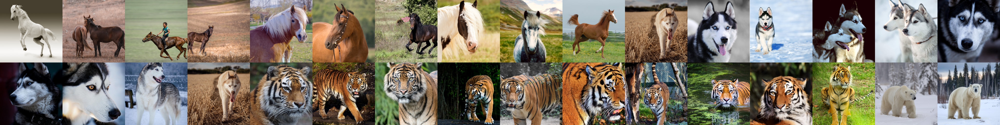

Min images: -1.00, Max images: 1.00
torch.Size([32, 3, 256, 256])
tensor([296, 296, 296, 296, 296, 296, 296, 296, 291, 291, 291, 291, 291, 291,
        291, 291, 291, 291, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340,
        294, 294, 294, 294])


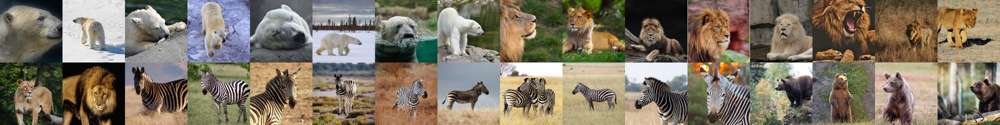

Min images: -1.00, Max images: 1.00
torch.Size([16, 3, 256, 256])
tensor([294, 294, 294, 294, 294, 294, 236, 236, 236, 236, 236, 236, 236, 236,
        236, 236])


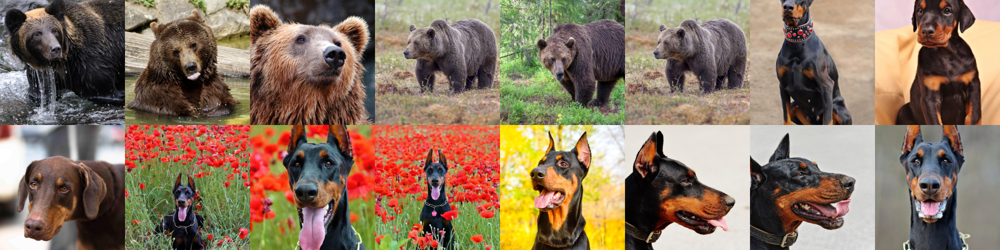

Min images: -1.00, Max images: 1.00


In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
from PIL import Image

data_dir = 'dataset/test-samples'

transform = transforms.Compose([
    transforms.Resize(256),                
    transforms.CenterCrop(256),            
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                        std=[0.5, 0.5, 0.5])

])

dataset = ClassIDImageDataset(data_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

for images, labels in dataloader:
    print(images.shape)  # e.g. torch.Size([32, 3, 224, 224])
    print(labels)        # e.g. tensor of class IDs

    # Plotting
    ims = tensor2im(images)        
    ims = ims_to_grid(ims, split=2, channel_last=True)  
    Image.fromarray(ims).show()

    print(f"Min images: {images.min():.2f}, Max images: {images.max():.2f}")




